# Lab 2: Image Segmentation, Filter, Feature points

This week you learned about manipulating image color from the pixel values and histogram. In this session you will get some more experience coding image segmentation algorithms and filtering with pixel location information too. 

There are four parts and you should aim to finish first two part in the lab sesion on Tuesday.

There are one task each for Part 1 and 2 and 4. Please complete them and submit them with the finished jupyternote book.

# Part 1 Segmentation

Your task will be to code a simple statistical method that uses Region growing or connected components.

## Task 1 K-means Segmentation


In previsou task you have oeprated over all pixels in the image for computing histogram. In this session you will get some experience coding image segmentation algorithms. Your task will be to code a simple statistical method that uses k-means clustering on all pixels.

K-means clustering is a well-known approach for separating data (often of high dimensionality) into
different groups depending on their distance. In the case of images this is a useful method for
segmenting an image into regions, provided that the number of regions (k) is known in advance. It is
based on the fact that pixels belonging to the same region will most likely have similar intensities. 

The algorithm is:

a) Given the number of clusters, k, initialise their centres to some values.

b) Go over the pixels in the image and assign each one to its closest cluster according to its distance to the centre of the cluster.

c) Update the cluster centres to be the average of the pixels added.

d) Repeat steps b and c until the cluster centres do not get updated anymore.

In [2]:
# %matplotlib inline is a magic function for displaying the image in the notebook
%matplotlib inline
import numpy as np
import cv2
import copy
import matplotlib.image as mpimg
from matplotlib import pyplot as plt

### Task 1.1 Use the k-means function in sklearn and see results

First, you can use the built-in kmeans function in sklearn and see the results. 
You can figure out how to this from the specification: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

### Load image

Important Note: Don't forget to convert the image to float representation.

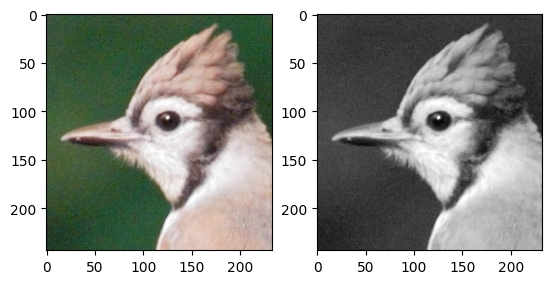

In [3]:
# Load image and conver to float representation
raw_img = cv2.imread("../dataset/sample_image.jpg")
raw_gray_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img = raw_img.astype(np.float32) / 255.
gray_img = raw_gray_img.astype(np.float32) / 255.
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(gray_img, "gray")

### Results on Gray-scale Image

[[0.7622439 ]
 [0.28945732]]


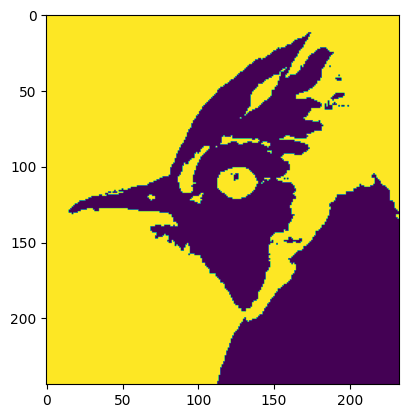

In [4]:
from sklearn.cluster import KMeans
# Flatten the image dimension first
gray_img_flat = gray_img.reshape(-1, 1)
kmeans = KMeans(n_clusters=2, random_state=0).fit(gray_img_flat)

H, W = gray_img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

[[0.8224714  0.7527608  0.7286135 ]
 [0.23834942 0.32622555 0.22156471]]


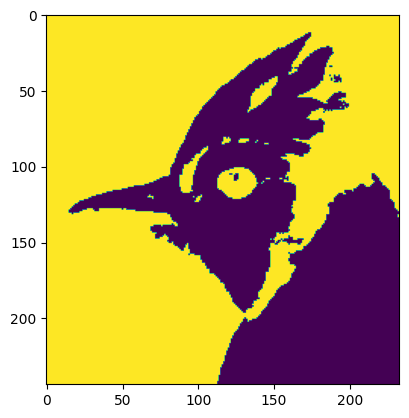

In [5]:
### Results on RGB image
img_flat = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=2, random_state=0).fit(img_flat)

H, W, _ = img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

### Task 1.2 Implement your own k-means

Now you need to implement your own k-means function. Use your function on different greyscale images and try comparing the results to the results you get from sklearn kmeans function.

### Implement your own functions here:

In [6]:
def my_kmeans(I, k):
    """
    Parameters
    ----------
    I : (H, W) array
        Normalised grayscale image, values in [0, 1].
    k : int
        Number of clusters.

    Returns
    -------
    clusters : (k,) array
        Final cluster centres (intensities).
    L : (H, W) array
        Label image, each pixel is in {0, ..., k-1}.
    """
    assert len(I.shape) == 2, "Wrong input dimensions! Please use a gray-scale image!"

    H, W = I.shape                                          # Height and width
    X = I.reshape(-1).astype(np.float32)                    # flatten
    N = X.shape[0]                                          # Number of pixels

    clusters = np.random.choice(X, size=k, replace=False)   # initialize cluster centroids

    for it in range(20):                                    # 20 iterations max
        
        distances = np.zeros((N, k), dtype=np.float32)      # initialize distances
        for i in range(N):                                  # each pixel
            for j in range(k):                              # each centroid
                distances[i, j] = abs(X[i] - clusters[j])   # distance from each pixel to each centroid

        labels = np.argmin(distances, axis=1)               # label to nearest centroid using minimum

        new_clusters = clusters.copy()                      # recompute centroids with average of the intensities for each cluster
        for j in range(k):
            mask = (labels == j)
            if np.any(mask):
                new_clusters[j] = X[mask].mean()            # mean intensisty value of the cluster is the new centroid
            else:
                new_clusters[j] = np.random.choice(X)

        shift = np.max(np.abs(new_clusters - clusters))     # check how much the clusters shifted
        clusters = new_clusters                             # update clusters

        if shift < 1e-4:                                    # tolerance for centroid shift
            break                                           # if centroid converges break loop

    L = labels.reshape(H, W)                                # reshape labels back to image form

    return clusters, L

def my_kmeans_rgb(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (greyscale to begin with) H by W array
    k: the number of clusters (use a simple image with k=2 to begin with)

    Returns
    ----------
    clusters: a vector that contains the final cluster centres
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """ 

    assert len(I.shape) == 3, "Wrong input dimensions! Please make sure you are using a RGB image!"

    H, W, C = I.shape                                       # Height, Width, Channels
    X = I.reshape(-1, 3).astype(np.float32)                 # N x 3 (RGB)
    N = X.shape[0]                                          # Number of pixels

    idx = np.random.choice(N, size=k, replace=False)        # get random centroids
    clusters = X[idx, :]                                    # Initialize clusters (k, 3)

    for it in range(20):

        distances = np.zeros((N, k), dtype=np.float32)      # initialize distances
        for i in range(N):                                  # each pixel
            for j in range(k):                              # each centroid
                diff = X[i] - clusters[j]                   # 3D vector
                distances[i, j] = np.sqrt(np.sum(diff**2))  # Euclidean distance between pixel and centroid

        labels = np.argmin(distances, axis=1)               # label to nearest centroid using minimum

        new_clusters = clusters.copy()                      # recompute centroids with average of the intensities for each cluster
        for j in range(k):
            mask = (labels == j)
            if np.any(mask):
                new_clusters[j] = X[mask].mean(axis=0)      # mean for each channel
            else:
                new_clusters[j] = X[np.random.choice(N)]

        shift = np.max(np.linalg.norm(new_clusters - clusters, axis=1)) # check how much the clusters shifted
        clusters = new_clusters                             # update clusters
        if shift < 1e-4:                                    # tolerance check
            break                                           # if converged, break loop

    L = labels.reshape(H, W)                                # reshape labels back to image shape

    return clusters, L

def my_kmeans_vec(I, k):
    """
    K-means function vectorized and works for both rgb and greyscale images

    """
    assert I.ndim in (2, 3), "I must be HxW (gray) or HxWx3 (RGB)"

    if I.ndim == 2:                                         # if grayscale
        H, W = I.shape                                      # Height, Width
        X = I.reshape(-1, 1).astype(np.float32)             # flatten
    else:                                                   # if RGB
        H, W, C = I.shape                                   # Height, Width, Channel
        assert C == 3, "RGB image must have 3 channels"
        X = I.reshape(-1, 3).astype(np.float32)             # N x 3

    N, D = X.shape                                          # N = number of pixels, D = 1 (gray) or 3 (RGB)

    idx = np.random.choice(N, size=k, replace=False)        # select random centroids
    clusters = X[idx].copy()                                # Initialize clusters, shape (k, D)

    for it in range(20):                                    # 20 max iterations
        diff = X[:, None, :] - clusters[None, :, :]         # calculate difference (vectorized)
        distances = np.linalg.norm(diff, axis=2)            # (N, k), Euclidean distance
        labels = np.argmin(distances, axis=1)               # Label to nearest centroid (N,)

        new_clusters = clusters.copy()                      # recompute centroids with average of the intensities for each cluster
        for j in range(k):
            mask = (labels == j)
            if np.any(mask):
                new_clusters[j] = X[mask].mean(axis=0)      # mean for each channel
            else:
                new_clusters[j] = X[np.random.randint(N)]

        shift = np.max(np.linalg.norm(new_clusters - clusters, axis=1)) # check how much the clusters shifted
        clusters = new_clusters                             # update clusters
        if shift < 1e-4:                                    # tolerance check
            break                                           # if converged, break loop

    L = labels.reshape(H, W)                                # reshape labels back to image

    if I.ndim == 2:                                         # for greyscale
        clusters = clusters.reshape(-1)                     # reshape cluster array

    return clusters, L

### Show results here:

[109.28201   68.829895 174.9474   217.0812  ]


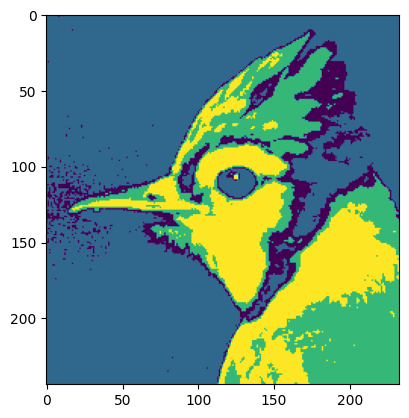

In [46]:
centroids, labels = my_kmeans(gray_img, 4)
print(centroids)
plt.imshow(labels)

### More things to try out:
1. Try different values for k. For k > 2 you will need some way to display the output L (other than simple black and white). Consider using a colour map with the imshow function.
2. Adapt your function so that it will handle colour images as well. What changes do you have to make?

[0.68606824 0.42855695 0.26992118 0.85129887]


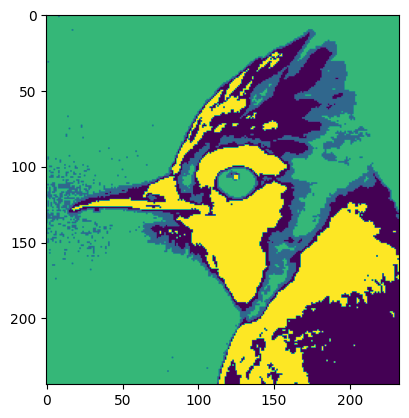

In [8]:
k=4
centroids, labels = my_kmeans_vec(gray_img, k)
plt.imshow(labels)
print(centroids)

[[0.23840699 0.32619616 0.22162087]
 [0.822552   0.75285155 0.72873324]]


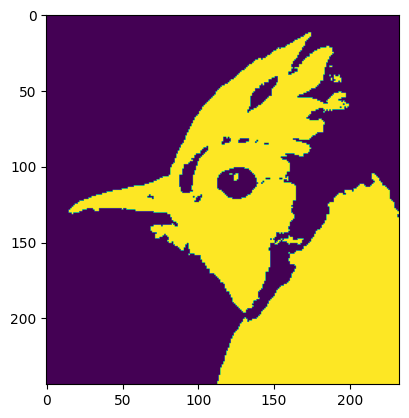

In [9]:
centroids, labels = my_kmeans_rgb(img, 2)
plt.imshow(labels)
print(centroids)

In [10]:
# to visualize the plots within the notebook
%matplotlib inline
# to enable interactive
#%matplotlib ipympl
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
import random
from PIL import Image

## Task 2: Region growing
Region growing is a simple way to segment a region of interest from the background of an image.
It takes in a gray-scale image and produces a binary image as output, where a value of 1 represents the region of interest and a value of 0 represents the background.

The algorithm is:
1. Start from a seed pixel.
2. Add neighbouring pixels that satisfy the criteria defining a region (e.g. similar intensity values, intensity above a threshold).
3. Repeat until we can include no more pixels.

Your task is to write a function in Python that implements the region growing algorithm.
Something like:
```
  segmented_img = region_growing(img, x, y)
```

* img: the image to be segmented
* x: the x-coordinate (j if indexed by numpy array) of the seed pixel
* y: the y-coordinate (i if indexed by numpy array) of the seed pixel
* segmented_img: the binary image output of region growing

**Hint:** This is process basically a **Breadth-first Search (BFS)**, which could be easily implemented it with a **queue** (check out collections.deque in PyThon): 

1. Initialise the queue with the seed pixel. 
2. Every time pop the first element from the queue and add its neighbour pixels to the queue if they satisfy the criteria (e.g. intensity above the threshold).
3. Finish when the queue is empty

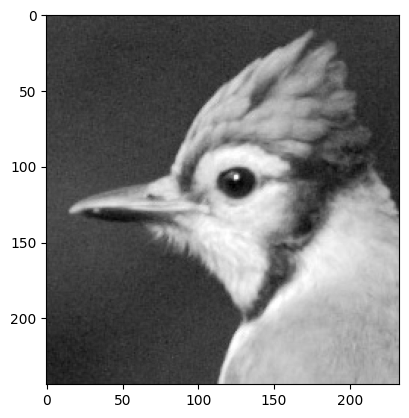

In [11]:
# Load your image
img = cv2.imread('../dataset/sample_image.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img, 'gray')
plt.show()

In [12]:
from collections import deque
def region_growing(img, x, y, thresh=100, connectedness=4):
    '''
    Impelemnt region growing algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :return: segmented image [H, W]
    '''
    assert img.ndim == 2, "Expect a gray-scale image!!!"
    
    H, W = img.shape
    segmented = np.zeros_like(img, dtype=np.uint8)
    visited = np.zeros_like(img, dtype=bool)
    seed_val = img[y, x]
    
    if connectedness == 4:
        directions = [(-1,0), (1,0), (0,-1), (0,1)]
    elif connectedness == 8:
        directions = [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]
    else:
        raise ValueError("connectedness must be 4 or 8")
    
    q = deque()
    q.append((y, x))
    visited[y, x] = True
    segmented[y, x] = 1
    
    while q:
        cy, cx = q.popleft()
        for dy, dx in directions:
            ny, nx = cy + dy, cx + dx
            if 0 <= ny < H and 0 <= nx < W:
                if not visited[ny, nx] and abs(int(img[ny, nx]) - int(seed_val)) <= thresh:
                    visited[ny, nx] = True
                    segmented[ny, nx] = 1
                    q.append((ny, nx))
    return segmented


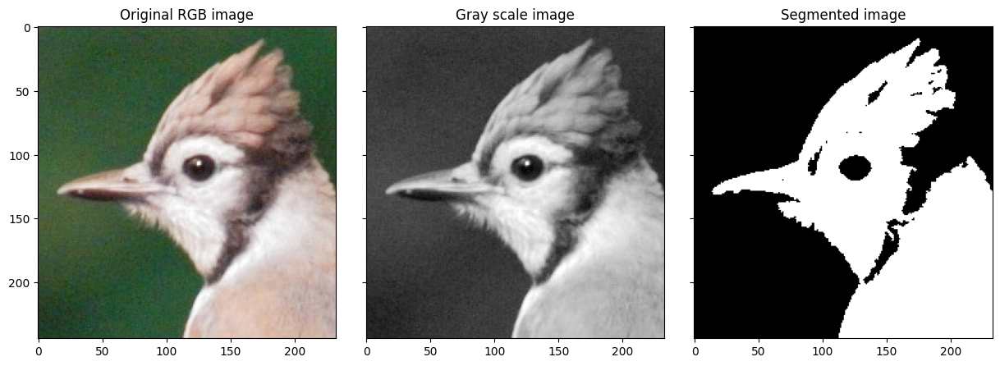

In [13]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=80, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image')
plt.show()

### There are two important factors that influence the performance of a region growing algorithm.

#### 1. The first is the seed pixel selection.
Try the following:
1. Pick a random pixel in the image.
2. Plot the histogram of the image, select a reasonable threshold and then search for a pixel whose intensity value is above the threshold (look for the `matplotlib.pyplot.hist()` function).
3. Do it manually (Hint: You can do this by enabling the interactive mode for `matplotlib`).

Which one is better?

(array([[  0.,  51., 181., ...,   0.,   0.,   0.],
        [  1.,  44., 187., ...,   0.,   0.,   0.],
        [  0.,  46., 183., ...,   0.,   0.,   0.],
        ...,
        [  0.,  74.,  50., ...,  56.,   0.,   0.],
        [  0.,  74.,  53., ...,  41.,   0.,   0.],
        [  0.,  86.,  43., ...,  38.,   0.,   0.]]),
 array([ 16.        ,  39.90000153,  63.79999924,  87.69999695,
        111.59999847, 135.5       , 159.3999939 , 183.30000305,
        207.19999695, 231.09999084, 255.        ]),
 <a list of 233 BarContainer objects>)

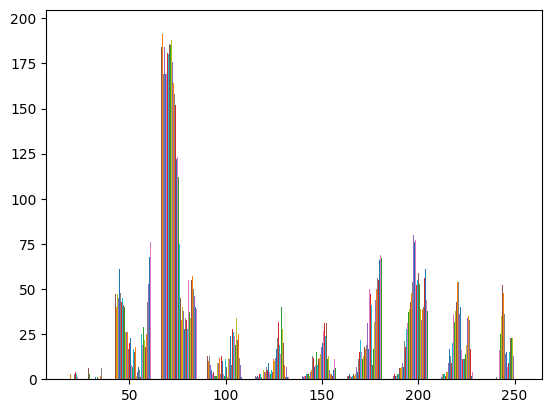

In [14]:
plt.hist(gray_img)

In [15]:
# Turn on interactive mode
%matplotlib tk  
# pick three points
plt.imshow(gray_img, 'gray')
print("Please click 3 points on the image...")
x = plt.ginput(3) 
print(x)
plt.close()

%matplotlib inline 
#  go back to inline plot

Please click 3 points on the image...
[]


#### 2. The second important factor is how to decide whether to add a neighbouring pixel to the existing region. 

Again, there are different options. Try the following alternatives:

1. Compare the pixel intensity value of the neighbours to a specified threshold (try the pixel intensity value of the initial seed pixel). If it is larger, then add it to the region. Depending on the seed pixel you might consider adding pixels with smaller intensities or even using a range of valid intensity values.
    
2. Compare the pixel intensity value of the neighbours to the average pixel intensity value of the existing region. The neighbour with the smallest difference to the average is added to the region. How will we stop adding neighbours to the region in this case?

Which one is better?

In [16]:
# Write your own code here
from collections import deque
def region_growing_avg(img, x, y, dist_thresh=50, connectedness=4):
    '''
    Impelemnt region growing algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :return: segmented image [H, W]
    '''
    assert img.ndim == 2, "Expect a gray-scale image!!!"
    # Write your own code here
    
    H, W = img.shape
    segmented = np.zeros_like(img, dtype=np.uint8)
    visited = np.zeros_like(img, dtype=bool)
    
    q = deque()
    q.append((y, x))
    visited[y, x] = True
    segmented[y, x] = 1

    region_vals = [int(img[y, x])]

    if connectedness == 4:
        directions = [(-1,0), (1,0), (0,-1), (0,1)]
    elif connectedness == 8:
        directions = [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]
    else:
        raise ValueError("connectedness must be 4 or 8")
    
    while q:
        cy, cx = q.popleft()
        region_mean = np.mean(region_vals)
        for dy, dx in directions:
            ny, nx = cy + dy, cx + dx
            if 0 <= ny < H and 0 <= nx < W and not visited[ny, nx]:
                neighbor_val = int(img[ny, nx])
                if abs(neighbor_val - region_mean) <= dist_thresh:
                    visited[ny, nx] = True
                    segmented[ny, nx] = 1
                    q.append((ny, nx))
                    region_vals.append(neighbor_val)
    return segmented


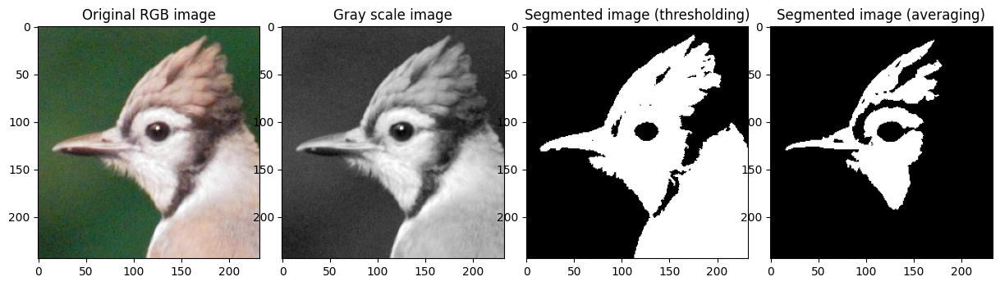

In [17]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=80, connectedness=4)
seg_img2 = region_growing_avg(gray_img, x, y, dist_thresh=50, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (thresholding)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (averaging)')
plt.show()

### More things to try out:
1. What kind of connectivity did you use for considering neighbour pixels? If you used 4- connectivity, try 8-connectivity, if you used 8-connectivity then try 4-connectivity.
    Does this change results?
    
2. What if there are multiple regions of interest? Consider using multiple seed points. How will you choose these?

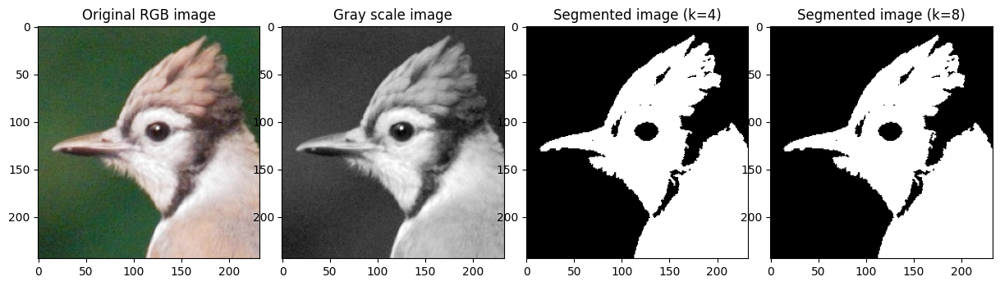

In [18]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=80, connectedness=4)
seg_img2 = region_growing(gray_img, x, y, thresh=80, connectedness=8)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (k=4)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (k=8)')
plt.show()

## Task 3: Connected Components 

Connected-component labeling (also known as connected-component analysis, or region labeling) is an algorithmic application of graph theory that is used to determine the connectivity of “blob”-like regions in a binary image.
Specifically, the algorithm labels each connected component of a binary image with a separate number.

Similar to Region Growing, for a single connected-component we can start from a seed and iteratively traverse all the neighbouring pixels. In this case, a Depth-first Serach (DFS) is a better way:

Then we just need to repeat this process for all the connected components in the image.

In [19]:
def connected_components_label(img, connectedness=4):
    assert img.ndim == 2, "Input must be a 2D binary image"
    assert connectedness in (4, 8), "connectedness must be 4 or 8"

    H, W = img.shape
    labels = np.zeros((H, W), dtype=np.int32)

    # define neighbor offsets
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    else:  # 8-connected
        neighbors = [
            (-1, 0), (1, 0), (0, -1), (0, 1),
            (-1, -1), (-1, 1), (1, -1), (1, 1)
        ]

    current_label = 0

    for y in range(H):
        for x in range(W):
            # start a new component if this is foreground and not labeled yet
            if img[y, x] != 0 and labels[y, x] == 0:
                current_label += 1
                # DFS stack
                stack = [(y, x)]
                labels[y, x] = current_label

                while stack:
                    cy, cx = stack.pop()

                    for dy, dx in neighbors:
                        ny, nx = cy + dy, cx + dx

                        # check bounds
                        if 0 <= ny < H and 0 <= nx < W:
                            # foreground & not yet labeled
                            if img[ny, nx] != 0 and labels[ny, nx] == 0:
                                labels[ny, nx] = current_label
                                stack.append((ny, nx))

    return labels

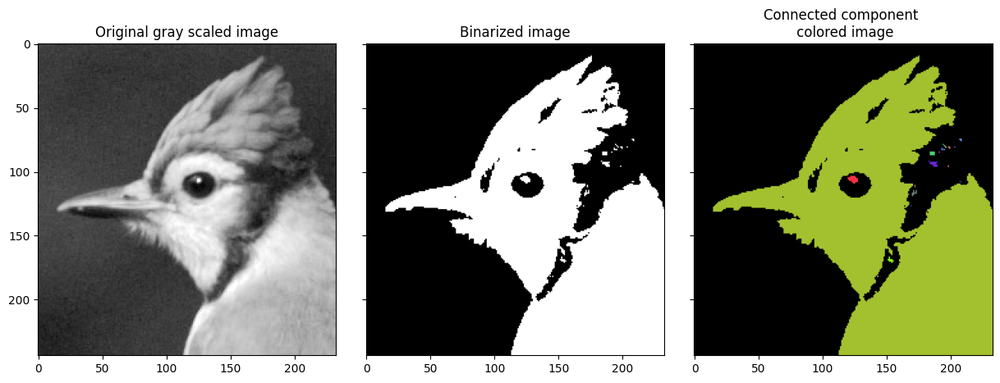

In [20]:
from utils import colourize

bimg = (gray_img > 100).astype(np.float32)
ccl_img = connected_components_label(bimg)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img))
axis[2].set_title('Connected component \n colored image')
plt.show()

The previous image was not a very good example to showcase the connected component algorithm. Next, you will see a better image.

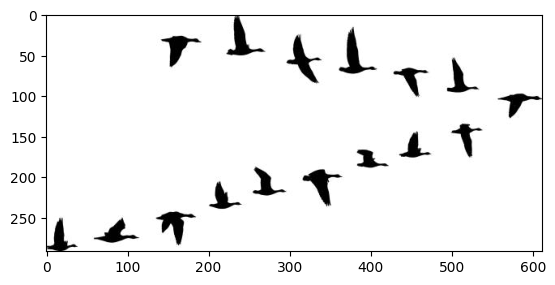

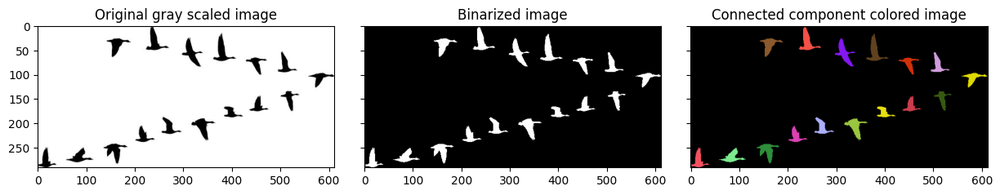

In [21]:
img2 = cv2.imread("../dataset/gooses.jpg")
gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img2, 'gray')

bimg2 = (gray_img2 < 100).astype(np.float32)
ccl_img2 = connected_components_label(bimg2)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img2, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg2, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img2))
axis[2].set_title('Connected component colored image')
plt.show()

### Tasks
Your task is to count the number of candies in the image below (Candy1):
1. Show your code and intermediate results for each step
2. Explain how the parameters were selected and what prior information you use.
3. Report your answer
4. Try your code on Candy2 without anychanges and report reuslt, discuss how would you improve the method for them.

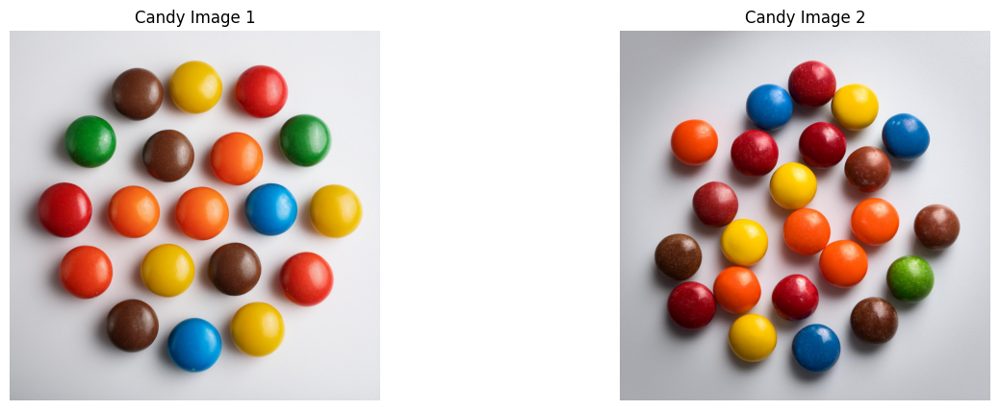

In [22]:
# Read first candy image
img1 = cv2.imread('../dataset/candy1.jpeg')
# Convert BGR to RGB for correct color display
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

# Read second candy image
img2 = cv2.imread('../dataset/candy2.jpeg')
# Convert BGR to RGB for correct color display
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create figure with two subplots side by side
plt.figure(figsize=(15, 5))

# Display first image
plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')

# Display second image
plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title('Candy Image 2')
plt.axis('off')

plt.show()

Number of candies: 19


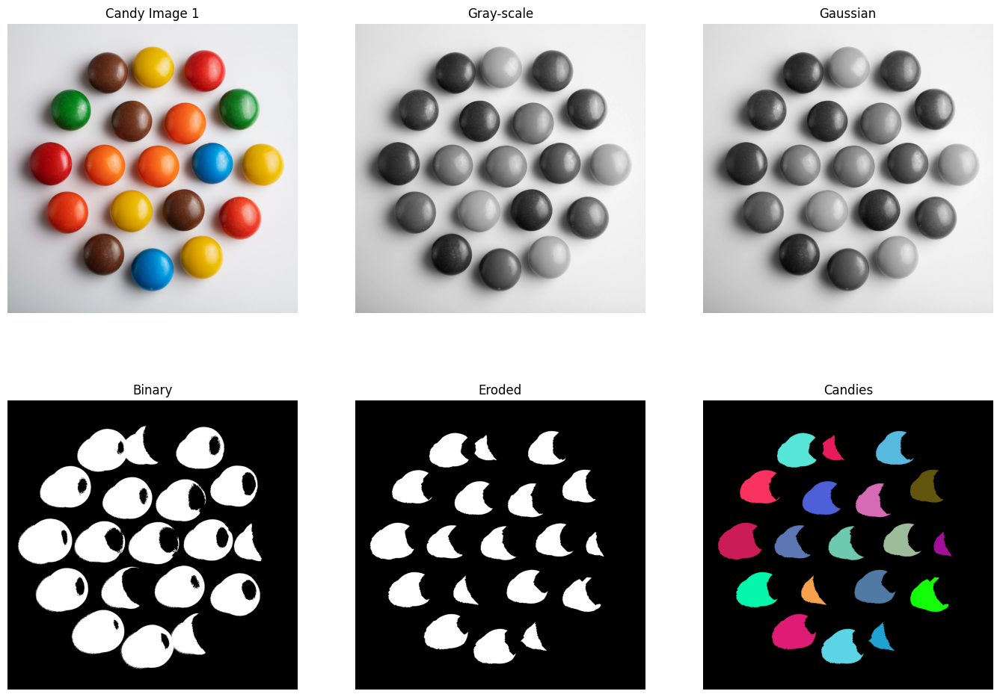

In [23]:
# Gray-scale image
img1_gray = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)

# Gaussian blur
blur = cv2.GaussianBlur(img1_gray, (9, 9), 0.1, 0.1)

# Binarize image with Otzu
_, bimg1 = cv2.threshold(blur, 0, 1,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# bimg1 is 0/1; convert to 0/255 for OpenCV morphology
bimg_uint = (bimg1 * 255).astype(np.uint8)

# small elliptical kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# 1) Erode a little to break thin connections
eroded = cv2.erode(bimg_uint, kernel, iterations=30)

# 2) Dilate back once to roughly restore size
processed = cv2.dilate(eroded, kernel, iterations=1)

# back to 0/1 float
bimg_clean = (processed > 0).astype(np.float32)

# Connect components
ccl_img1 = connected_components_label(bimg_clean, connectedness=8)

# Count components
labels = ccl_img1.astype(np.int32)
max_label = labels.max()

print("Number of candies:", max_label)

# Print Images
plt.figure(figsize=(17,12))

plt.subplot(2, 3, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(img1_gray, 'gray')
plt.title('Gray-scale')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(blur, 'gray')
plt.title('Gaussian')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bimg1, 'gray')
plt.title('Binary')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(bimg_clean, 'gray')
plt.title('Eroded')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(colourize(ccl_img1))
plt.title('Candies')
plt.axis('off')

plt.show()

Number of candies: 13


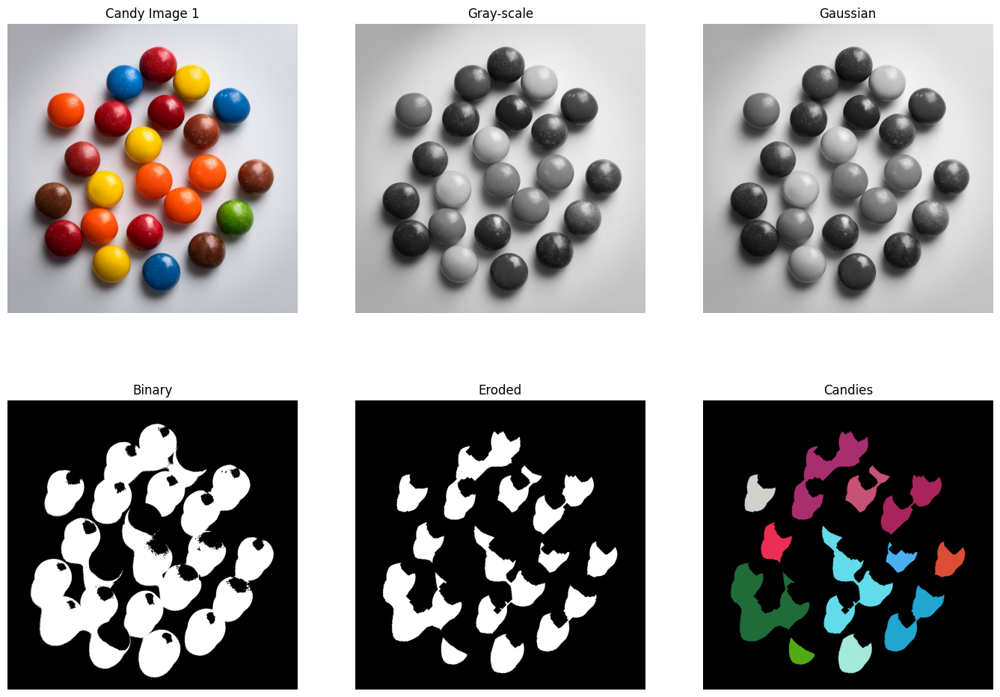

In [24]:
# Gray-scale image
img2_gray = cv2.cvtColor(img2_rgb, cv2.COLOR_RGB2GRAY)

# Gaussian blur
blur2 = cv2.GaussianBlur(img2_gray, (9, 9), 0.1, 0.1)

# Binarize image with Otzu
_, bimg2 = cv2.threshold(blur2, 0, 1,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# bimg1 is 0/1; convert to 0/255 for OpenCV morphology
bimg_uint2 = (bimg2 * 255).astype(np.uint8)

# small elliptical kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# 1) Erode a little to break thin connections
eroded2 = cv2.erode(bimg_uint2, kernel, iterations=30)

# 2) Dilate back once to roughly restore size
processed2 = cv2.dilate(eroded2, kernel, iterations=1)

# back to 0/1 float
bimg_clean2 = (processed2 > 0).astype(np.float32)

# Connect components
ccl_img2 = connected_components_label(bimg_clean2, connectedness=8)

# Count components
labels2 = ccl_img2.astype(np.int32)
max_label2 = labels2.max()

print("Number of candies:", max_label2)

# Print Images
plt.figure(figsize=(17,12))

plt.subplot(2, 3, 1)
plt.imshow(img2_rgb)
plt.title('Candy Image 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(img2_gray, 'gray')
plt.title('Gray-scale')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(blur2, 'gray')
plt.title('Gaussian')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bimg2, 'gray')
plt.title('Binary')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(bimg_clean2, 'gray')
plt.title('Eroded')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(colourize(ccl_img2))
plt.title('Candies')
plt.axis('off')

plt.show()

# Part 2: Filter
In the last lecture you learned about linear image filtering operations like correlation and
convolution and how these can be applied directly on the image.
These kind of filtering operations have many uses, ranging from smoothing and noise
reduction, to feature enhancement and sharpening, calculating image derivatives, edge
detection and even template matching.
Your task today is to code your own linear filtering functions operating on the image domain.

In [62]:
import numpy as np
import time
import cv2
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
# to visualize the plots within the notebook
%matplotlib inline

## Task 4 Convolution
Convolution is a fundamental operation for applying linear filters to images. It takes as input
an image (greyscale) I and a filter kernel K and returns the result I’ of convolving the image
with this filter.

Definition: Given a greyscale image I and a filter K of size (2N + 1) x (2M + 1) (we use odd
dimension filters like 3 x 3, 5 x 5 etc.), convolution is defined as:

\begin{equation}
I'(x, y) = \sum_{i=-a}^a \sum_{j=-b}^b K(i, j) I(x - i, y - j)
\end{equation}

Your task is to write your own convolution function (do not use the conv2() function) and test
it with different filters. How will you handle the behaviour of the filter in the edges of the
image (pad with zeros, copy the edge etc.)?

Smoothing filters that reduce noise in images are quite useful in image processing. Use a
simple mean filter like:

\begin{equation}
\begin{bmatrix}1 & 1 & 1\\1 & 1 & 1\\1 & 1 & 1\end{bmatrix}
\end{equation}

This filter replaces each pixel by the average of its neighbourhood. Now if we want
something better, we can try weighing the contributions of the neighbouring pixels by their
proximity to the centre pixel. Try a Gaussian filter, which is defined as: 

\begin{equation}
G_{\sigma} = \frac{1}{2\pi \sigma^2} e^{-\frac{(x^2 + y^2)}{2 \sigma^2}}
\end{equation}

where $\sigma$ is the standard deviationof the Gaussian. This is a continuous function, so your filter will need to sample it in both x and y directions (use np.meshgrid()), keeping in mind the value for $\sigma$ that you chose. Try different filter sizes and different values for $\sigma$ and compare the results. Here is the results obtained using opencv built-in functions. If your implementation is correct, you should expect to have similar results.

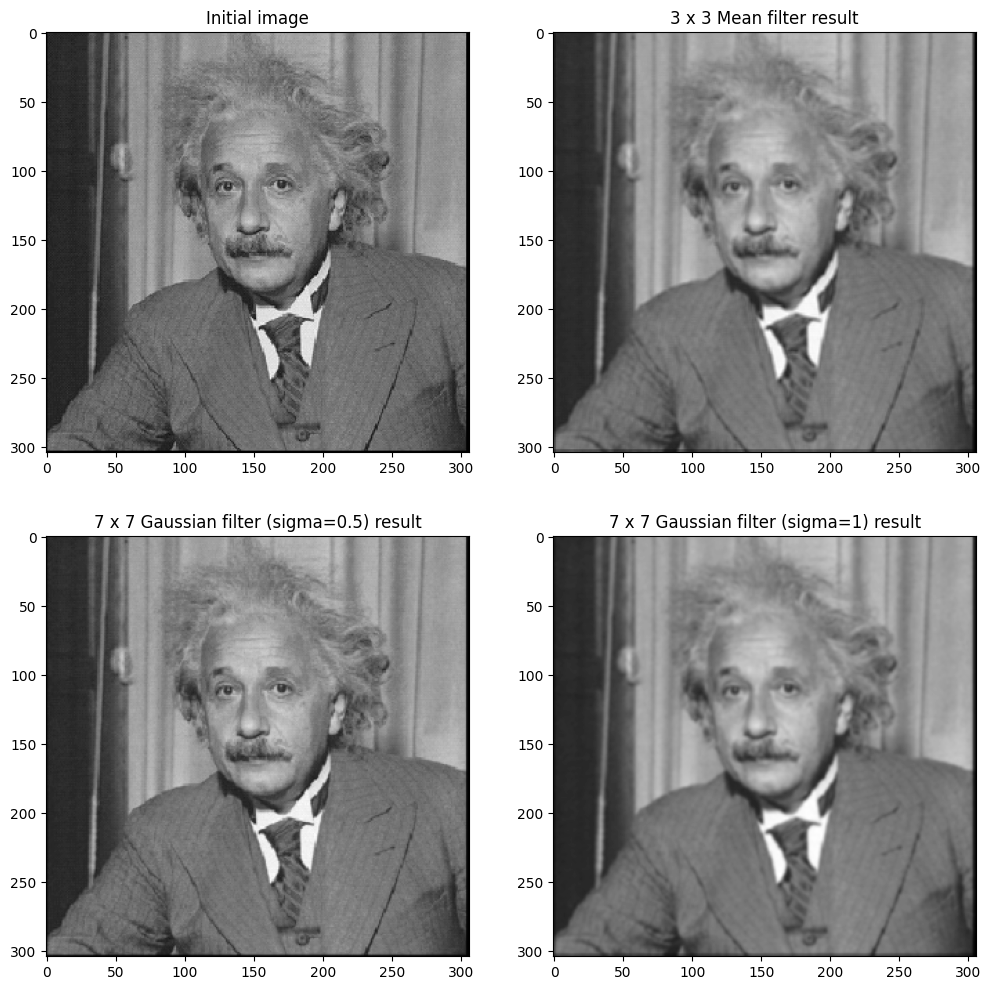

In [63]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
mean_blur = cv2.blur(img_gray, (3, 3))  # mean filter 3x3
gaussian_1 = cv2.GaussianBlur(img_gray, (7, 7), 0.5, 0.5)  # gaussian filter 7x7, sigma = 0.5
gaussian_2 = cv2.GaussianBlur(img_gray, (7, 7), 1., 1.)  # gaussian filter 7x7, sigma = 1.0
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(gaussian_2, "gray")
plt.show()

### Implement your own code here:

hint: You can use `cv2.copyMakeBorder` to do paddings to the image. Figure out how to use it by yourself!

In [65]:
def apply_filter(src_img, kernel):
    '''
    Impelemnt filtering algorithm
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :return rst_img: filtered image
    '''
    assert len(src_img.shape) == 2, print("Dimension mismatch! Please supply gray-scale image only!")
    assert len(kernel.shape) == 2, print("Dimension mismatch! Please supply 2D kernel only!")

    src = src_img.astype(np.float32)                                                    # load image
    kh, kw = kernel.shape                                                               # load kernel shape
    H, W = src.shape                                                                    # Height and Width of image

    pad_h = kh // 2                                                                     # padding height
    pad_w = kw // 2                                                                     # padding width

    padded = np.pad(src, pad_width=((pad_h, pad_h), (pad_w, pad_w)), mode='edge')       # adds padding to image for the kernel

    rst_img = np.zeros_like(src, dtype=np.float32)                                      # output image as same size as input image

    for i in range(H):                                                                  # for every row
        for j in range(W):                                                              # for every column

            region = padded[i:i+kh, j:j+kw]                                             # region shape (kh, kw) extracted from padded image
            rst_img[i, j] = np.sum(region * kernel)                                     # output is sum of region times kernel

    return rst_img
    
def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    '''
    kernel = np.ones((h, w), dtype=np.float32) / (h * w)                                # if 3x3, then 1/9 each element -> mean
    return kernel

def get_gaussian_kernel(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")

    y, x = np.mgrid[-(h//2): (h//2)+1, -(w//2):  (w//2)+1]                              # coordinate grid

    g = np.exp(-(x*x + y*y) / (2.0 * sigma*sigma))                                      # gaussian function on x,y
    
    kernel = g / g.sum()                                                                # normalize kernel

    return kernel.astype(np.float32)

In [66]:
"""
Get kernels and apply filter here
"""
k_mean = get_mean_filter_kernel(3, 3)
G1 = get_gaussian_kernel(7, 7, 0.5)
G2 = get_gaussian_kernel(7, 7, 1.)
img_mean_blur = apply_filter(img_gray, k_mean)
img_gaussian_1 = apply_filter(img_gray, G1)
img_gaussian_2 = apply_filter(img_gray, G2)


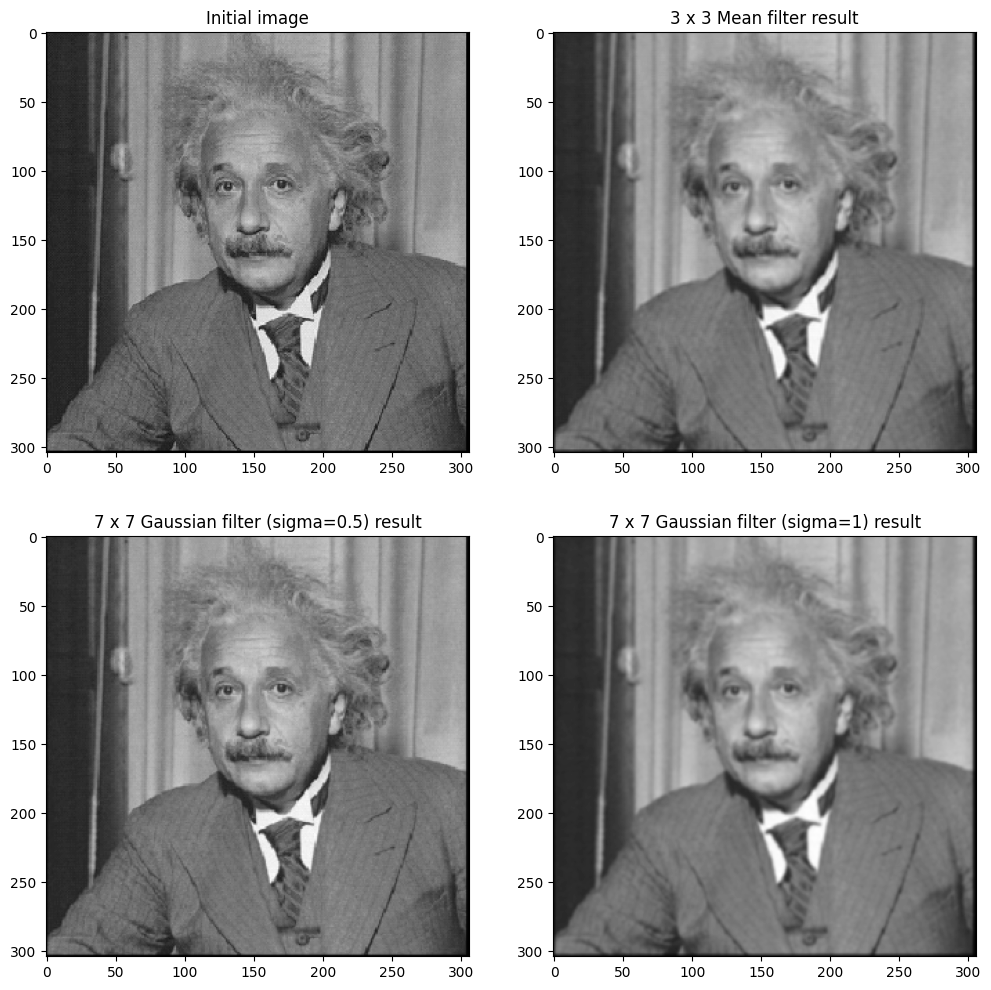

In [67]:

"""
Plot the results
"""
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(img_mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(img_gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(img_gaussian_2, "gray")
plt.show()

## Task 5: Edge Detection with Sobel Filter
The Sobel filter is commonly used to detect edges in images by calculating the gradient of the image intensity. It emphasizes areas of high spatial frequency that correspond to edges. Here, we will apply the Sobel filter to detect edges in the grayscale image of Albert Einstein.

We start by applying separate Sobel filters in both the x and y directions, which will highlight horizontal and vertical edges, respectively. The combined result will provide a comprehensive edge map of the entire image.



### Tasks:
* Use your own kenel and extract edge on x and y with sobel filter with only numpy.
* Using the package - *time* does your algorithm compare to the built-in sobel filtering of opencv? Also, measure the time difference and compare result from your implementation and opencv

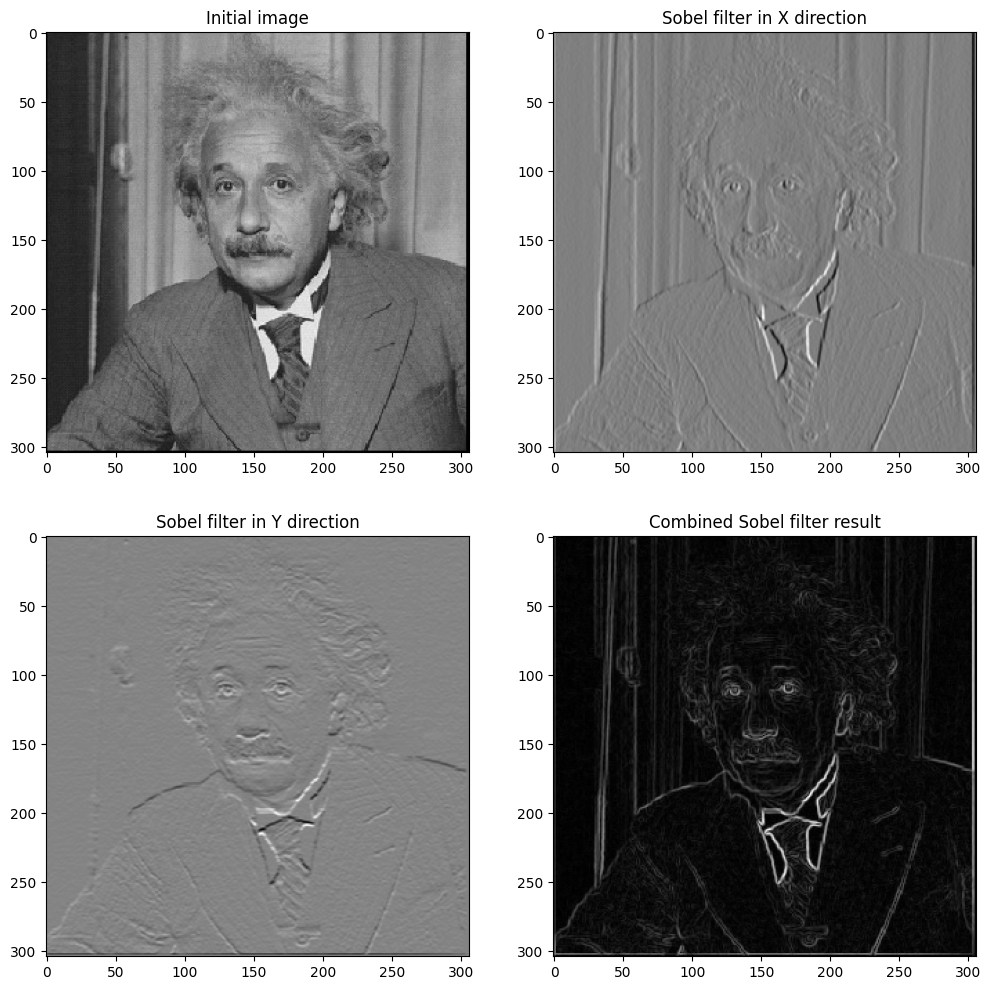

Process Time: 0.00047


In [60]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
t0 = time.time()                                            # initialize time
sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter in x direction
sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter in y direction
sobel_combined = cv2.magnitude(sobel_x, sobel_y)  # Combine the gradients
t1 = time.time()
process_time = t1-t0
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("Sobel filter in X direction")
plt.imshow(sobel_x, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("Sobel filter in Y direction")
plt.imshow(sobel_y, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("Combined Sobel filter result")
plt.imshow(sobel_combined, "gray")
plt.show()
print(f"Process Time: {process_time:.5f}")

### Own Sobel function

In [56]:
def apply_filter(src_img, kernel):
    '''
    Impelemnt filtering algorithm
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :return rst_img: filtered image
    '''
    assert len(src_img.shape) == 2, print("Dimension mismatch! Please supply gray-scale image only!")
    assert len(kernel.shape) == 2, print("Dimension mismatch! Please supply 2D kernel only!")

    src = src_img.astype(np.float32)                                                    # load image
    kh, kw = kernel.shape                                                               # load kernel shape
    H, W = src.shape                                                                    # Height and Width of image

    pad_h = kh // 2                                                                     # padding height
    pad_w = kw // 2                                                                     # padding width

    padded = np.pad(src, pad_width=((pad_h, pad_h), (pad_w, pad_w)), mode='edge')       # adds padding to image for the kernel

    rst_img = np.zeros_like(src, dtype=np.float32)                                      # output image as same size as input image

    for i in range(H):                                                                  # for every row
        for j in range(W):                                                              # for every column

            region = padded[i:i+kh, j:j+kw]                                             # region shape (kh, kw) extracted from padded image
            rst_img[i, j] = np.sum(region * kernel)                                     # output is sum of region times kernel

    return rst_img

def sobel_own(img_gray, x, y):
    """
    Returns:
        Sobel filtered image in the requested direction.
    """
    assert img_gray.ndim == 2, "Sobel expects a gray-scale image"           # gray-image
    assert x != y, "Select only one direction x or y"                       # x or y only
    
    Kx = np.array([[-1, 0,  1],                                             # Sobel x kernel
                   [-2, 0,  2],
                   [-1, 0,  1]], dtype=np.float32)

    Ky = np.array([[-1, -2, -1],                                            # Sobel y kernel
                   [ 0,  0,  0],
                   [ 1,  2,  1]], dtype=np.float32)

    if (x, y) == (1, 0):                                                    # if x direction
        kernel = Kx                                                         # derivative along x
    else:                                                                   # (0, 1)
        kernel = Ky                                                         # derivative along y

    img = img_gray.astype(np.float32)
    sobel_resp = apply_filter(img, kernel)                                  # own function to apply 
    
    return sobel_resp

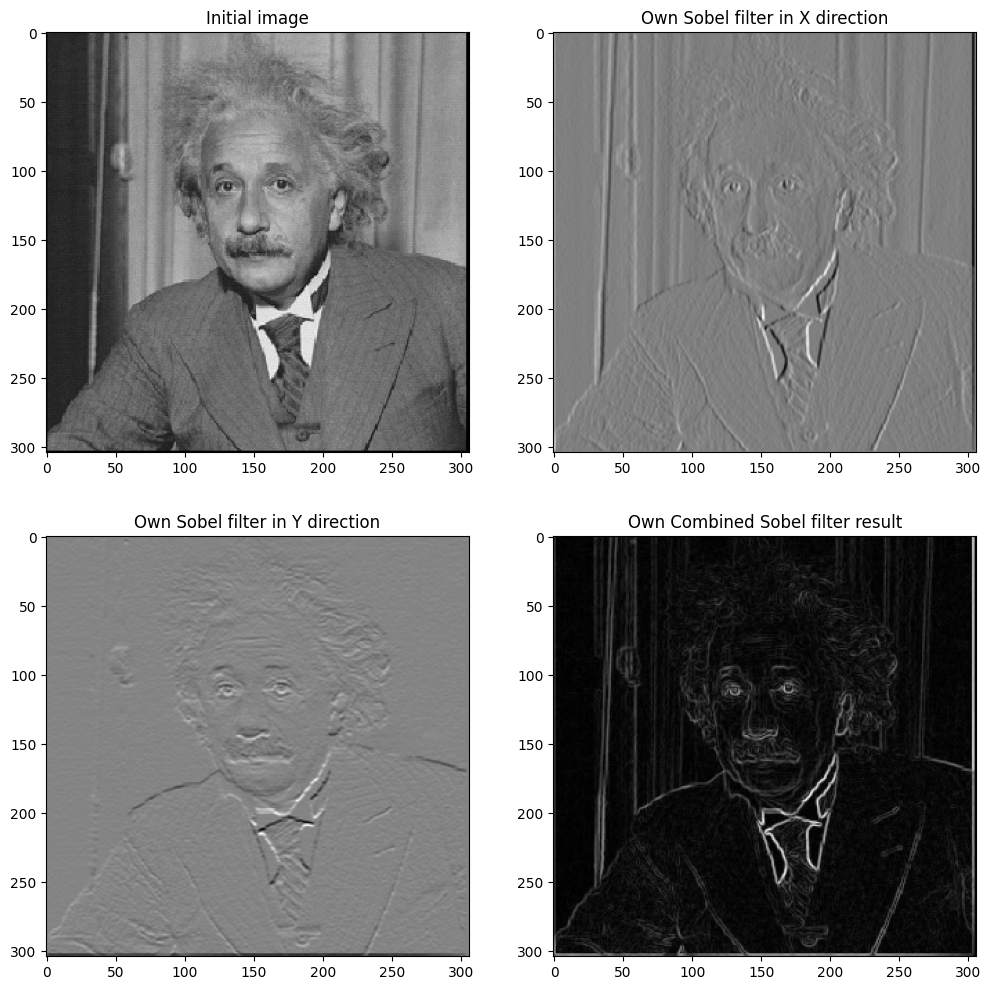

Process Time: 0.36344


In [61]:
t0 = time.time()
own_sobel_x = sobel_own(img_gray, 1, 0)  # Sobel filter in x direction
own_sobel_y = sobel_own(img_gray, 0, 1)  # Sobel filter in y direction
own_sobel_combined = cv2.magnitude(own_sobel_x, own_sobel_y)  # Combine the gradients
t1 = time.time()
process_time = t1-t0

fig = plt.figure(figsize=(12, 12))                            # plot
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("Own Sobel filter in X direction")
plt.imshow(own_sobel_x, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("Own Sobel filter in Y direction")
plt.imshow(own_sobel_y, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("Own Combined Sobel filter result")
plt.imshow(own_sobel_combined, "gray")
plt.show()

print(f"Process Time: {process_time:.5f}")

# Part 3: Corner Detection

In the second lecture of the week we went through about corner detection algorithms and how these can be used to find
interesting features on an image that can be used in applications such as stereo matching,
3D reconstruction, tracking, localization and recognition.
Our task here is to code two corner detection algorithms, the Moravec and the Harris
corner detector.

In [26]:
import numpy as np
import copy
import cv2
from matplotlib import pyplot as plt
import random
from PIL import Image
#to visualize the plots within the notebook
%matplotlib inline
# for making plots looking nicer
plt.style.use('fivethirtyeight')

## Task 6: Moravec corner detector

The Moravec corner detector uses a patch centred on each pixel as its own matching
template. The patch is shifted so that it is centred on each of the 8 neighbours of the pixel
and the sum of squared differences (SSD) is calculated between the original patch and the
shifted patch:

$$
    E = \sum_{\Delta \mathbf{x}} w(\Delta \mathbf{x})\big(I(\mathbf{x} + \Delta \mathbf{x}) - I(\mathbf{x}^{\prime} + \Delta \mathbf{x}\big)^2
$$


$w$ is a weighting function with the same dimension as the patch, you can use a Gaussian or constant weights. The corner metric (cornerness) is then taken to be the minimum of the SSD values calculated for each of the eight shifts of the window.
A pixel is marked as a corner if its cornerness is above a user-specified threshold.


Your task is to write your implementation of the Moravec corner detector.
It will take as input a grayscale image, the window size, the threshold and optionally a Gaussian function for $w$. It will give as output a corner map as a list of pixel coordinates where a corner is detected.


In [28]:
def draw_corners(image, corners_map, color=(255, 0, 0)):
    """Draw a point for each possible corner.
    color image: [H, W, 3]
    corners_map: list of pixel coordinates (xy indexing)
    """
    
    color_img = cv2.cvtColor(image[:,:,0], cv2.COLOR_GRAY2BGR)
    for corner in corners_map:
        cv2.circle(color_img, corner, 1, color, -1)
    return color_img

def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    '''
    kernel = np.ones((h, w), dtype=np.float32) / (h * w)        # if 3x3, then 1/9 each element -> mean
    return kernel

def get_gaussian_kernel(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")

    # coordinate grid centered at 0
    y = np.arange(-(h // 2), h // 2 + 1)
    x = np.arange(-(w // 2), w // 2 + 1)
    X, Y = np.meshgrid(x, y)                                    # shape (h, w)

    kernel = np.exp(-(X**2 + Y**2) / (2 * sigma**2))            # Gaussian calculation

    kernel = kernel / np.sum(kernel)                            # Normalize

    return kernel.astype(np.float32)

def moravec(image, window_size=3, threshold=100., weights=None):
    """Moravec's corner detection for each pixel of the image.
    image: grayscale image: [H, W]
    """
    assert window_size % 2 == 1, "window size should be an odd number"
    
    img = image.astype(np.float32)
    H, W = img.shape
    r = window_size // 2

    # If no weights provided, use uniform weights
    if weights is None:
        weights = np.ones((window_size, window_size), dtype=np.float32)
    else:
        weights = weights.astype(np.float32)
        assert weights.shape == (window_size, window_size), \
            "weights kernel must match window size"

    # 8 directions (shifts) for Moravec
    directions = [
        (1, 0),  (-1, 0),
        (0, 1),  (0, -1),
        (1, 1),  (-1, 1),
        (1, -1), (-1, -1)
    ]

    # Corner response map
    response = np.zeros((H, W), dtype=np.float32)

    # Avoid borders so both window and shifted window stay inside image
    for y in range(r + 1, H - r - 1):
        for x in range(r + 1, W - r - 1):
            # reference window centered at (x, y)
            W0 = img[y - r:y + r + 1, x - r:x + r + 1]

            min_ssd = np.inf

            for dy, dx in directions:
                y2 = y + dy
                x2 = x + dx

                # shifted window centered at (x2, y2)
                W1 = img[y2 - r:y2 + r + 1, x2 - r:x2 + r + 1]

                diff = W0 - W1
                ssd = np.sum(weights * (diff * diff))

                if ssd < min_ssd:
                    min_ssd = ssd

            response[y, x] = min_ssd

    # Thresholding
    candidates = response > threshold

    # Non-maximum suppression in 3x3 neighborhood
    corners_mask = np.zeros_like(candidates, dtype=bool)
    for y in range(1, H - 1):
        for x in range(1, W - 1):
            if not candidates[y, x]:
                continue
            local = response[y - 1:y + 2, x - 1:x + 2]
            if response[y, x] == np.max(local):
                corners_mask[y, x] = True

    # Convert mask to list of (x, y) coordinates (xy indexing!)
    ys, xs = np.where(corners_mask)
    corners_list = list(zip(xs, ys))

    return corners_list

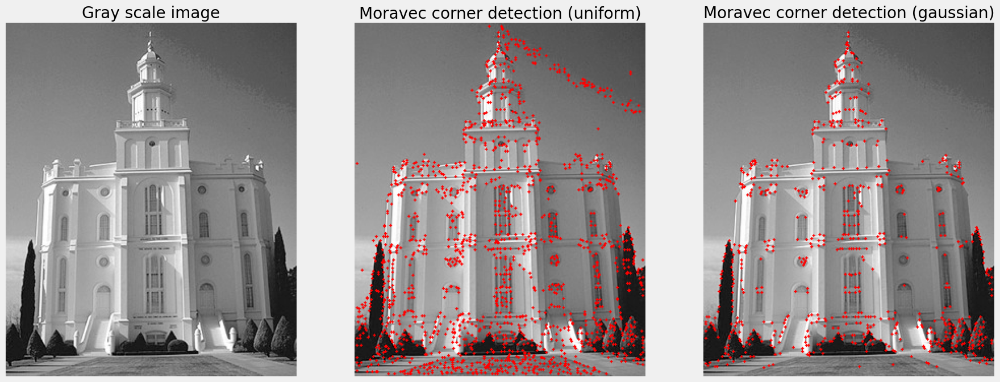

In [29]:
img = cv2.imread('../dataset/building.png')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

moravec_corners = moravec(gray_img, threshold=200.)
img_with_corner = draw_corners(img, moravec_corners)

moravec_corners2 = moravec(gray_img, threshold=200., weights=get_gaussian_kernel(3, 3, 1.0))
img_with_corner2 = draw_corners(img, moravec_corners2)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(img_with_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Moravec corner detection (uniform)')
axis[1].set_axis_off()

axis[2].imshow(img_with_corner2, 'gray')
axis[2].grid(False)
axis[2].set_title('Moravec corner detection (gaussian)')
axis[2].set_axis_off()

plt.show()

## Task 7: Harris corner detector

The Harris corner detector builds upon the concepts of the Moravec corner detector, but
overcomes its limitations by generalising the measure of cornerness.
The basic limitation of the Moravec detector is that it only calculates cornerness for the 8 main directions
corresponding to the neighbours of a pixel, which means it will not detect a corner in any other direction.
The Harris detector uses the image structure tensor to overcome this. The image structure tensor is:

$$
    S = 
    \begin{pmatrix}
     I^2_x   & I_x I_y\\
     I_x I_y & I^2_y
    \end{pmatrix}
$$

where $I_x$ is the partial derivative of the image in the x direction and $I_y$ is the partial derivative of the image in the y direction.
The structure tensor summarizes the main directions of the gradient of the image for every pixel and therefore its two eigenvalues can be used to determine whether there is a corner at a pixel (if both eigenvalues are large).
The cornerness response metric is then defined as follows:

$$
    C = \text{det}(S) - k \text{tr}(S)^2 \\
$$

where $k$ is a an empirically determined hyper-parameter, usually in the range of $[0.04, 0.06]$

### Non-maximum Suppression (NMS)

In most cases, naivly thresholding the response map will lead to a lot of false-positives, i.e. blobs around real corners. One way to mitigate this to use Non-maximum Suppression (NMS). There is a number of ways of doing it, but the principle is to only keep the pixel with maxium response for aby local regions. You can try by simply setting pixels that have an 8 neighbour with higher cornerness to zero.

In [30]:
def apply_filter(src_img, kernel):
    
    assert len(src_img.shape) == 2, print("Dimension mismatch! Please supply gray-scale image only!")
    assert len(kernel.shape) == 2, print("Dimension mismatch! Please supply 2D kernel only!")

    src = src_img.astype(np.float32)
    kh, kw = kernel.shape
    H, W = src.shape

    # padding sizes
    pad_h = kh // 2
    pad_w = kw // 2

    # pad by copying border pixels
    padded = np.pad(src, pad_width=((pad_h, pad_h), (pad_w, pad_w)), mode='edge')   # copies border values

    # output image
    rst_img = np.zeros_like(src, dtype=np.float32)

    # convolution
    for i in range(H):
        for j in range(W):
            # extract local region
            region = padded[i:i+kh, j:j+kw]  # shape (kh, kw)
            # element-wise multiply and sum
            rst_img[i, j] = np.sum(region * kernel)

    return rst_img

def apply_gaussian_filter(src_img, k=5, sigma=1.0):

    kernel = get_gaussian_kernel(k, k, sigma)
    img = apply_filter(src_img, kernel)
    return img

def gradientX(image):
    kernel = np.array([[-1., 0., 1.],
                       [-2., 0., 2.],
                       [-1., 0., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image

def gradientY(image):
    kernel = np.array([[-1., -2., -1.],
                       [0., 0., 0.],
                       [1., 2., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image

def nms(response, threshold, window_size=3):
    """
    Non-maximum suppression on a response map.

    Parameters
    ----------
    response : (H, W) float32
        Harris (or other) corner response.
    threshold : float
        Minimum response value to be considered a corner candidate.
    window_size : int
        Size of neighborhood for NMS (must be odd).

    Returns
    -------
    corners : list of (x, y) tuples
        Pixel coordinates of detected corners (xy indexing).
    """
    assert response.ndim == 2, "response must be a 2D array"
    assert window_size % 2 == 1, "window_size must be odd"

    H, W = response.shape
    r = window_size // 2

    corners = []

    for y in range(r, H - r):
        for x in range(r, W - r):
            val = response[y, x]
            if val < threshold:
                continue

            # local window
            patch = response[y - r:y + r + 1, x - r:x + r + 1]
            if val == np.max(patch):
                corners.append((x, y))  # (x, y), consistent with draw_corners

    return corners

def harris(image, k=0.05, win_size=5, sigma=1.0):
    """
    Compute Harris corner response for a gray-scale image.

    Parameters
    ----------
    image : (H, W) float32
        Grayscale image.
    k : float
        Harris free parameter, typically in [0.04, 0.06].
    win_size : int
        Window size for Gaussian smoothing of the second-moment matrix.
    sigma : float
        Sigma for Gaussian smoothing.

    Returns
    -------
    R : (H, W) float32
        Harris corner response map.
    """
    assert image.ndim == 2, "Harris expects a gray-scale image"

    img = image.astype(np.float32)

    # Gradients (you already defined gradientX and gradientY)
    Ix = gradientX(img)
    Iy = gradientY(img)

    # Products of derivatives
    Ix2 = Ix * Ix
    Iy2 = Iy * Iy
    Ixy = Ix * Iy

    # Smooth them with Gaussian (second-moment matrix)
    A = apply_gaussian_filter(Ix2, k=win_size, sigma=sigma)
    B = apply_gaussian_filter(Iy2, k=win_size, sigma=sigma)
    C = apply_gaussian_filter(Ixy, k=win_size, sigma=sigma)

    # Harris response
    detM = A * B - C * C
    traceM = A + B
    R = detM - k * (traceM ** 2)

    return R

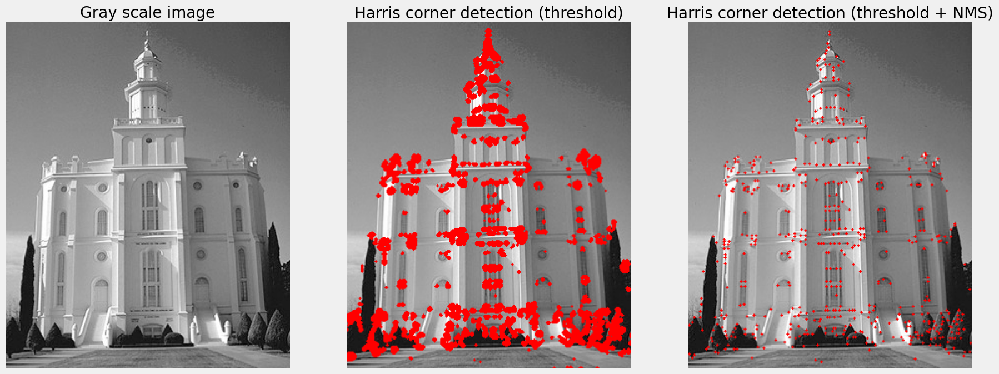

In [32]:
img = cv2.imread('../dataset/building.png')
k = 0.05
threshold = 2000.
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
H, W = gray_img.shape

#-------------Write your code here------------
R = harris(gray_img, k)
corners = [(x, y) for y in range(H) for x in range(W) if R[y, x] > threshold]
#---------------------------------------------
harris_img_corner = draw_corners(img, corners)

# corners after NMS
#-------------Write your code here------------
corners_nms = nms(R, threshold)
#---------------------------------------------
harris_img_corner_nms = draw_corners(img, corners_nms)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(harris_img_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Harris corner detection (threshold)')
axis[1].set_axis_off()

axis[2].imshow(harris_img_corner_nms, 'gray')
axis[2].grid(False)
axis[2].set_title('Harris corner detection (threshold + NMS)')
axis[2].set_axis_off()

plt.show()

# Part 4 Feature extraction and Matching


## Task 8 SIFT Feature Detection and Matching

#### Step 1: SIFT Feature Detection and Visualization
Here we demonstrates how SIFT detects features in a single image:
- Loads and preprocesses the image
- Detects SIFT keypoints
- Visualizes the keypoints on the image
- Shows keypoint orientations and scales

#### Step 2: Feature Matching Between Images
Here we show how SIFT features are matched between two images:
- Detects features in both images
- Matches features using ratio test
- Visualizes the matching results with lines connecting matched points
- Shows match distance distribution

### Tasks:

1. With the example provided:
   1.  Vary the paratmeter on  'max_image_size', 'max_features', 'ratio_thresh' to see their impact on perforamnce, such as matching reuslt and time consumption.

2. Capture your own image pair with:
   1. Slight variation of angle and match them
   2. Big variation of angle and match them
   3. Different time of the day or lighting variation and match them
   4. One image with the Arducam camera and another one with aother device (such as your phone or laptop webcam) and match them

3. Compare Harris detector result with SIFT and FAST (https://docs.opencv.org/3.4/df/d0c/tutorial_py_fast.html)


In [33]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

#### Common Functions

In [35]:
# Common Functions
def load_image(image_path, max_size):
    """Load and resize image if too large"""
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    
    # Resize if image is too large
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))
        img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    return img_gray, img_rgb

def visualize_features(img_rgb, keypoints, title="SIFT Features"):
    """Visualize SIFT features with circles and orientations"""
    img_with_kp = img_rgb.copy()
    
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        size = int(kp.size)
        angle = kp.angle * np.pi / 180.0
        
        cv2.circle(img_with_kp, (x, y), size, (0, 255, 0), 1)
        end_x = int(x + size * np.cos(angle))
        end_y = int(y + size * np.sin(angle))
        cv2.line(img_with_kp, (x, y), (end_x, end_y), (0, 255, 0), 1)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_kp)
    plt.title(f"{title}\n{len(keypoints)} keypoints detected")
    plt.axis('off')
    plt.tight_layout()

    
def visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, good_matches, 
                     distances, max_display_matches):
    """Visualize feature matches between images"""
    good_matches = sorted(good_matches, key=lambda x: x.distance)[:max_display_matches]
    
    plt.figure(figsize=(12, 6))
    
    # Plot histogram
    plt.subplot(1, 2, 1)
    plt.hist(distances, bins=30, color='blue', alpha=0.7)
    plt.title(f"Match Distances\n({len(good_matches)} shown of {len(distances)} matches)")
    plt.xlabel("Distance")
    plt.ylabel("Count")
    
    # Draw matches
    match_img = cv2.drawMatches(
        img1_rgb, keypoints1,
        img2_rgb, keypoints2,
        good_matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0)
    )
    
    plt.subplot(1, 2, 2)
    plt.imshow(match_img)
    plt.title("SIFT Matches")
    plt.axis('off')
    plt.tight_layout()


In [36]:
def detect_features(img, max_features):
    """Detect SIFT features"""
    sift = cv2.SIFT_create(nfeatures=max_features)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


In [37]:
def match_features(descriptors1, descriptors2, ratio_thresh):
    """Match features using BFMatcher with ratio test"""
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    good_matches = []
    distances = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
            distances.append(m.distance)
    
    return good_matches, distances

#### Extract Feature Points


=== Stage 1: Single Image SIFT Detection ===
Image size: (554, 800, 3)
Processing time: 0.127 seconds
Features detected: 1000


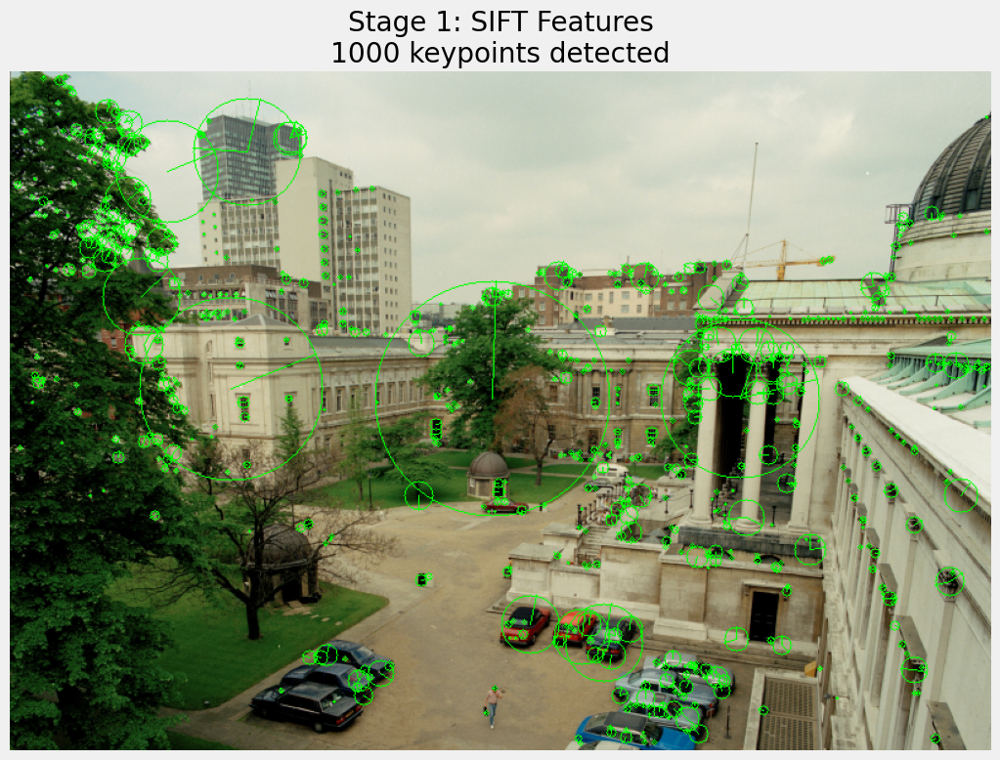

In [38]:
# Parameters for Stage 1
params = {
    'max_image_size': 800,
    'max_features': 1000,
}

# Image path
img_path = '../dataset/UCL_21May91.jpg'

print("\n=== Stage 1: Single Image SIFT Detection ===")

# Load and process image
t0 = time.time()
img_gray, img_rgb = load_image(img_path, params['max_image_size'])
print(f"Image size: {img_rgb.shape}")

# Detect features
keypoints, descriptors = detect_features(img_gray, params['max_features'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Features detected: {len(keypoints)}")

# Visualize
visualize_features(img_rgb, keypoints, "Stage 1: SIFT Features")
plt.show()

#### Match feature Points 


=== Stage 2: Feature Matching ===
Image 1 features: 1000
Image 2 features: 1001
Processing time: 0.263 seconds
Matches found: 104 good matches


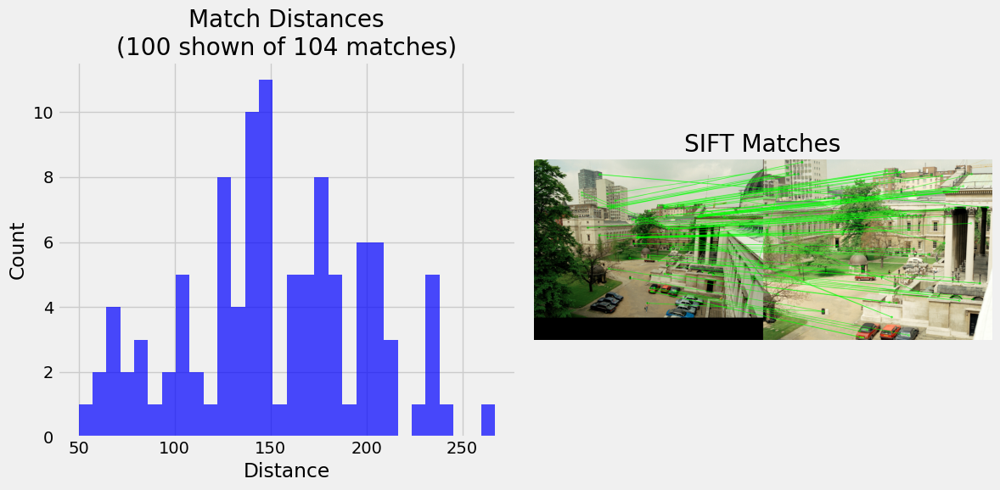

In [39]:
# Parameters for Stage 2
params = {
    'max_image_size': 800,
    'max_features': 1000,
    'ratio_thresh': 0.75,
    'max_display_matches': 100
}
# Image paths
img1_path = '../dataset/UCL_21May91.jpg'
img2_path = '../dataset/UCLQuad_21May91.jpg'

print("\n=== Stage 2: Feature Matching ===")

# Load and process first image
t0 = time.time()
img1_gray, img1_rgb = load_image(img1_path, params['max_image_size'])
keypoints1, descriptors1 = detect_features(img1_gray, params['max_features'])
print(f"Image 1 features: {len(keypoints1)}")

# Load and process second image
img2_gray, img2_rgb = load_image(img2_path, params['max_image_size'])
keypoints2, descriptors2 = detect_features(img2_gray, params['max_features'])
print(f"Image 2 features: {len(keypoints2)}")

# Match features
good_matches, distances = match_features(descriptors1, descriptors2, 
                                       params['ratio_thresh'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Matches found: {len(good_matches)} good matches")

# Visualize matches
visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, 
                good_matches, distances, params['max_display_matches'])
plt.show()

### Own Image Pair


=== Stage 1: Single Image SIFT Detection ===
Image size: (500, 281, 3)
Processing time: 0.102 seconds
Features detected: 401


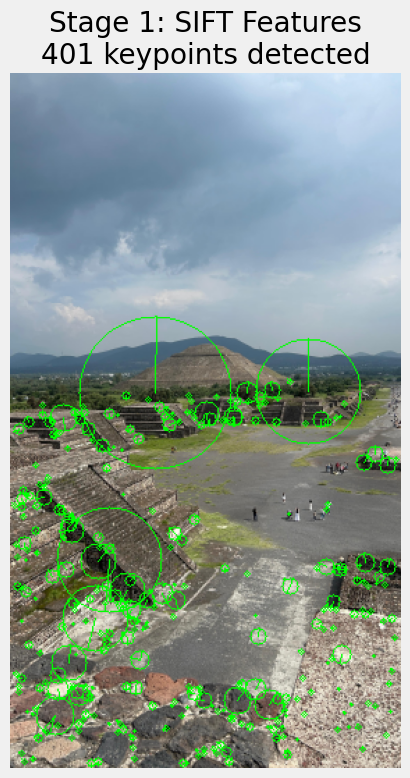

In [40]:
# Parameters for Stage 1
params = {
    'max_image_size': 500,
    'max_features': 400,
}

# Image path
img_path = '../dataset/pyramids2.jpeg'

print("\n=== Stage 1: Single Image SIFT Detection ===")

# Load and process image
t0 = time.time()
img_gray, img_rgb = load_image(img_path, params['max_image_size'])
print(f"Image size: {img_rgb.shape}")

# Detect features
keypoints, descriptors = detect_features(img_gray, params['max_features'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Features detected: {len(keypoints)}")

# Visualize
visualize_features(img_rgb, keypoints, "Stage 1: SIFT Features")
plt.show()


=== Stage 2: Feature Matching ===
Image 1 features: 401
Image 2 features: 400
Processing time: 0.182 seconds
Matches found: 24 good matches


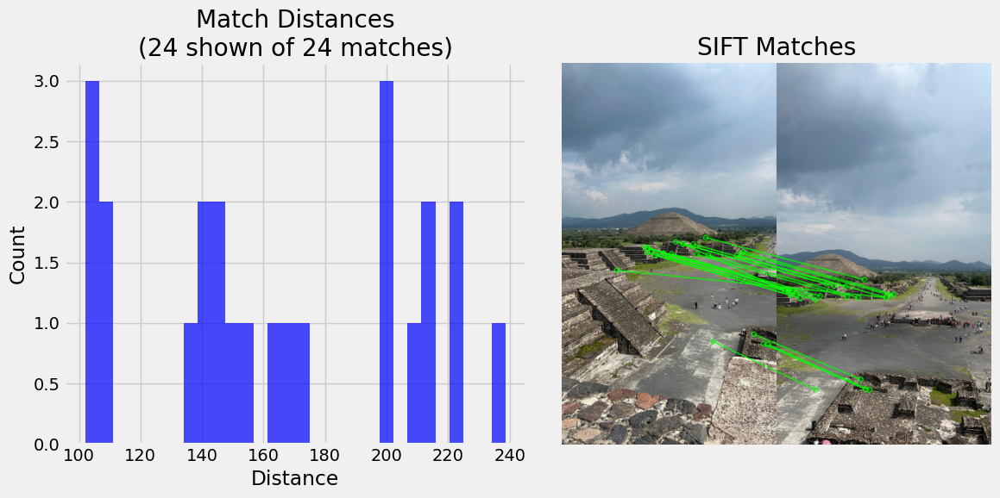

In [41]:
# Parameters for Stage 2
params = {
    'max_image_size': 500,
    'max_features': 400,
    'ratio_thresh': 0.67,
    'max_display_matches': 100
}
# Image paths
img1_path = '../dataset/pyramids2.jpeg'
img2_path = '../dataset/pyramids1.jpeg'

print("\n=== Stage 2: Feature Matching ===")

# Load and process first image
t0 = time.time()
img1_gray, img1_rgb = load_image(img1_path, params['max_image_size'])
keypoints1, descriptors1 = detect_features(img1_gray, params['max_features'])
print(f"Image 1 features: {len(keypoints1)}")

# Load and process second image
img2_gray, img2_rgb = load_image(img2_path, params['max_image_size'])
keypoints2, descriptors2 = detect_features(img2_gray, params['max_features'])
print(f"Image 2 features: {len(keypoints2)}")

# Match features
good_matches, distances = match_features(descriptors1, descriptors2, 
                                       params['ratio_thresh'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Matches found: {len(good_matches)} good matches")

# Visualize matches
visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, 
                good_matches, distances, params['max_display_matches'])
plt.show()